<a href="https://colab.research.google.com/github/promitdutta-biz/data_analyst_projects/blob/main/company_bankruptcy_prediction_latest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Here we are analysing as a FinTech firm whose main task is to pick potentially risky compannies which will go bankrupt in future by analyzng their financial data. This is to be done on the basis of past data obtained from UCI Machine Learning Repository: https://archive.ics.uci.edu/ml/datasets/Taiwanese+Bankruptcy+Prediction

The objective may be to stay away from investment into such firms which may result into asset destruction or it can be to make short positions in the security market, in a conducive situation.

The data were collected from the Taiwan Economic Journal1 for the years 1999 – 2009. Company bankruptcy was defined based on the business regulations of the **Taiwan Stock Exchange**.

Further Source:
Financial Ratios and Corporate Governance Indicators in Bankruptcy Prediction: A Comprehensive Study. European Journal of Operational Research.
https://www.sciencedirect.com/science/article/pii/S0377221716000412

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score, RepeatedStratifiedKFold, GridSearchCV
import xgboost as xgboost
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import balanced_accuracy_score, roc_auc_score, make_scorer, accuracy_score, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay, classification_report, roc_curve, precision_recall_curve, f1_score, auc

In [ ]:
#@title columns descriptions
# Y - Bankrupt?: Class label
# X1 - ROA(C) before interest and depreciation before interest: Return On Total Assets(C)
# X2 - ROA(A) before interest and % after tax: Return On Total Assets(A)
# X3 - ROA(B) before interest and depreciation after tax: Return On Total Assets(B)
# X4 - Operating Gross Margin: Gross Profit/Net Sales
# X5 - Realized Sales Gross Margin: Realized Gross Profit/Net Sales
# X6 - Operating Profit Rate: Operating Income/Net Sales
# X7 - Pre-tax net Interest Rate: Pre-Tax Income/Net Sales
# X8 - After-tax net Interest Rate: Net Income/Net Sales
# X9 - Non-industry income and expenditure/revenue: Net Non-operating Income Ratio
# X10 - Continuous interest rate (after tax): Net Income-Exclude Disposal Gain or Loss/Net Sales
# X11 - Operating Expense Rate: Operating Expenses/Net Sales
# X12 - Research and development expense rate: (Research and Development Expenses)/Net Sales
# X13 - Cash flow rate: Cash Flow from Operating/Current Liabilities
# X14 - Interest-bearing debt interest rate: Interest-bearing Debt/Equity
# X15 - Tax rate (A): Effective Tax Rate
# X16 - Net Value Per Share (B): Book Value Per Share(B)
# X17 - Net Value Per Share (A): Book Value Per Share(A)
# X18 - Net Value Per Share (C): Book Value Per Share(C)
# X19 - Persistent EPS in the Last Four Seasons: EPS-Net Income
# X20 - Cash Flow Per Share
# X21 - Revenue Per Share (Yuan ¥): Sales Per Share
# X22 - Operating Profit Per Share (Yuan ¥): Operating Income Per Share
# X23 - Per Share Net profit before tax (Yuan ¥): Pretax Income Per Share
# X24 - Realized Sales Gross Profit Growth Rate
# X25 - Operating Profit Growth Rate: Operating Income Growth
# X26 - After-tax Net Profit Growth Rate: Net Income Growth
# X27 - Regular Net Profit Growth Rate: Continuing Operating Income after Tax Growth
# X28 - Continuous Net Profit Growth Rate: Net Income-Excluding Disposal Gain or Loss Growth
# X29 - Total Asset Growth Rate: Total Asset Growth
# X30 - Net Value Growth Rate: Total Equity Growth
# X31 - Total Asset Return Growth Rate Ratio: Return on Total Asset Growth
# X32 - Cash Reinvestment %: Cash Reinvestment Ratio
# X33 - Current Ratio
# X34 - Quick Ratio: Acid Test
# X35 - Interest Expense Ratio: Interest Expenses/Total Revenue
# X36 - Total debt/Total net worth: Total Liability/Equity Ratio
# X37 - Debt ratio %: Liability/Total Assets
# X38 - Net worth/Assets: Equity/Total Assets
# X39 - Long-term fund suitability ratio (A): (Long-term Liability+Equity)/Fixed Assets
# X40 - Borrowing dependency: Cost of Interest-bearing Debt
# X41 - Contingent liabilities/Net worth: Contingent Liability/Equity
# X42 - Operating profit/Paid-in capital: Operating Income/Capital
# X43 - Net profit before tax/Paid-in capital: Pretax Income/Capital
# X44 - Inventory and accounts receivable/Net value: (Inventory+Accounts Receivables)/Equity
# X45 - Total Asset Turnover
# X46 - Accounts Receivable Turnover
# X47 - Average Collection Days: Days Receivable Outstanding
# X48 - Inventory Turnover Rate (times)
# X49 - Fixed Assets Turnover Frequency
# X50 - Net Worth Turnover Rate (times): Equity Turnover
# X51 - Revenue per person: Sales Per Employee
# X52 - Operating profit per person: Operation Income Per Employee
# X53 - Allocation rate per person: Fixed Assets Per Employee
# X54 - Working Capital to Total Assets
# X55 - Quick Assets/Total Assets
# X56 - Current Assets/Total Assets
# X57 - Cash/Total Assets
# X58 - Quick Assets/Current Liability
# X59 - Cash/Current Liability
# X60 - Current Liability to Assets
# X61 - Operating Funds to Liability
# X62 - Inventory/Working Capital
# X63 - Inventory/Current Liability
# X64 - Current Liabilities/Liability
#X65 - Working Capital/Equity
# X66 - Current Liabilities/Equity
# X67 - Long-term Liability to Current Assets
# X68 - Retained Earnings to Total Assets
# X69 - Total income/Total expense
# X70 - Total expense/Assets
# X71 - Current Asset Turnover Rate: Current Assets to Sales
# X72 - Quick Asset Turnover Rate: Quick Assets to Sales
# X73 - Working capitcal Turnover Rate: Working Capital to Sales
# X74 - Cash Turnover Rate: Cash to Sales
# X75 - Cash Flow to Sales
# X76 - Fixed Assets to Assets
# X77 - Current Liability to Liability
# X78 - Current Liability to Equity
# X79 - Equity to Long-term Liability
# X80 - Cash Flow to Total Assets
# X81 - Cash Flow to Liability
# X82 - CFO to Assets
# X83 - Cash Flow to Equity
# X84 - Current Liability to Current Assets
# X85 - Liability-Assets Flag: 1 if Total Liability exceeds Total Assets, 0 otherwise
# X86 - Net Income to Total Assets
# X87 - Total assets to GNP price
# X88 - No-credit Interval
# X89 - Gross Profit to Sales
# X90 - Net Income to Stockholder's Equity
# X91 - Liability to Equity
# X92 - Degree of Financial Leverage (DFL)
# X93 - Interest Coverage Ratio (Interest expense to EBIT)
# X94 - Net Income Flag: 1 if Net Income is Negative for the last two years, 0 otherwise
# X95 - Equity to Liability

In [ ]:
path= "/content/drive/MyDrive/data_science_proj/code/company_bankruptcy.csv"
df = pd.read_csv(path)
df.head()

In [ ]:
path= "/content/drive/MyDrive/company_bankruptcy.csv"
df = pd.read_csv(path)
df.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

In [ ]:
# let's check for any duplicate entry
df.duplicated().sum()

0

The Net Income to Total Assets ratio is significantly lower in most of the Bankrupt companies.

In [ ]:
df[['Bankrupt?',' Net Income to Total Assets']].groupby(by='Bankrupt?').mean()*100

,Net Income to Total Assets
Bankrupt?,
0,81.008313
1,73.808348


In [ ]:
df[['Bankrupt?',' Net Income to Total Assets']].groupby(by='Bankrupt?').mean()*100

,Net Income to Total Assets
Bankrupt?,
0,81.008313
1,73.808348


In [ ]:
(df[df[' Net Income to Total Assets']<=0.62]['Bankrupt?'].value_counts(normalize=True)*100)

1    60.0
0    40.0
Name: Bankrupt?, dtype: float64

In [ ]:
(df[df[' Net Income to Total Assets']<=0.6]['Bankrupt?'].value_counts(normalize=True)*100).to_frame()

,Bankrupt?
1,62.962963
0,37.037037


In [ ]:
df[['Bankrupt?',' Retained Earnings to Total Assets']].groupby(by='Bankrupt?').mean()*100

,Retained Earnings to Total Assets
Bankrupt?,
0,93.574921
1,90.424370


In [ ]:
df[['Bankrupt?',' Retained Earnings to Total Assets']].groupby(by='Bankrupt?').median()*100

,Retained Earnings to Total Assets
Bankrupt?,
0,93.805821
1,91.292315


Debt plays a vital role in companies' bankruptcy. In bankrupt companies the debt to total net worth was ~3 times that of the companies which were solvent.

In [ ]:
df[['Bankrupt?',' Total debt/Total net worth']].groupby(by='Bankrupt?').median()*100

,Total debt/Total net worth
Bankrupt?,
0,0.537667
1,1.572329


**Quick Ratio** is the (Current_Asset - Inventory)/Current_Liability. Less the quick ratio worse the financial situation of a company. The companies which went bankrupt had a worse quick ratio (less by 64%) than those which stayed solvent.

In [ ]:
df[['Bankrupt?',' Quick Ratio']].groupby(by='Bankrupt?').median()*100

,Quick Ratio
Bankrupt?,
0,0.757904
1,0.275051


**ROA**(C) before interest and depreciation before interest explains how much a company can make as a percent of its asset before interest, taxes, depreciation. This indicator is macro economic factor agnostic and doesn't account for the type of asset it owns. Less the ROA(C) before interest and depreciation before interest, implies the company is performing worse than its  peers. We can notice that the bankrupt companies have around 6% less rerturn on this front.

In [ ]:
df[['Bankrupt?',' ROA(C) before interest and depreciation before interest']].groupby(by='Bankrupt?').median()*100

,ROA(C) before interest and depreciation before interest
Bankrupt?,
0,50.431434
1,44.132989


Here, we can introduce a parameter as (Quick_Ratio X Total_debt_to_Total_net_worth)*1000/ROA as Par1 which shows that in most of the bankrupt companies the value goes near 9.96.

In [ ]:
df['Par1'] = df[' Quick Ratio']* df[' Total debt/Total net worth']*1000/df[' ROA(C) before interest and depreciation before interest']
df[['Bankrupt?','Par1']].groupby(by='Bankrupt?').median()*100

,Par1
Bankrupt?,
0,7.683588
1,9.969050


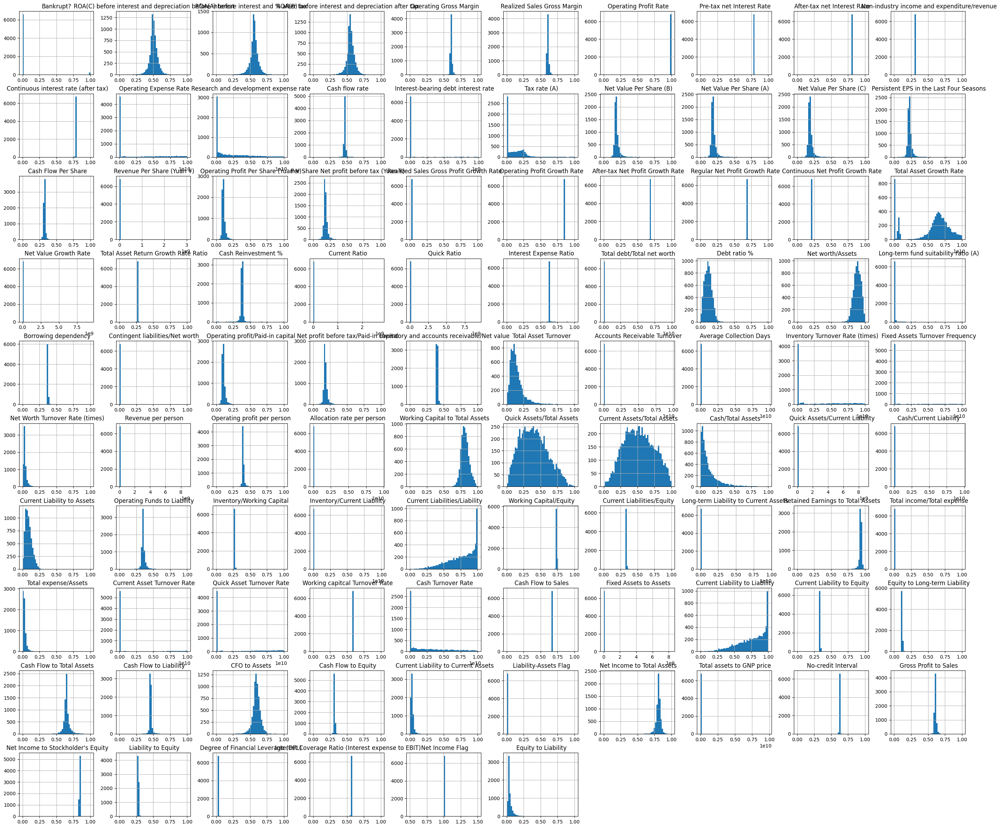

In [ ]:
df.hist(figsize = (35,30), bins = 50)
plt.show()

The net income is negative in all the companies under considerartion. May be that is the first red flag because of which they are under the scanner.

In [ ]:
df[' Net Income Flag'].value_counts(normalize=True)*100

1    100.0
Name:  Net Income Flag, dtype: float64

The point to note is net negative income doesn't necessarily mean that company will go bankrupt. There are multiple reasons like macro economic factor, low cash reserve, or higher liabilities than assets which can draw a company towards bankruptcy.

In [ ]:
df[df[' Net Income Flag']==1]['Bankrupt?'].value_counts(normalize=True)*100

0    96.77372
1     3.22628
Name: Bankrupt?, dtype: float64

When liability goes more than the asset owned, the risk of bankruptcy is really high. This is becasue in the cases of liquidating the assets, the company can lose all its income generating assets and falls into a downward spiral.

In [ ]:
df[' Liability-Assets Flag'].value_counts(normalize=True)*100

0    99.882681
1     0.117319
Name:  Liability-Assets Flag, dtype: float64

In [ ]:
df[df[' Liability-Assets Flag']==1]['Bankrupt?'].value_counts(normalize=True)*100

1    75.0
0    25.0
Name: Bankrupt?, dtype: float64

In [ ]:
df[df[' Liability-Assets Flag']==0]['Bankrupt?'].value_counts(normalize=True)*100

0    96.858024
1     3.141976
Name: Bankrupt?, dtype: float64

In [ ]:
pd.set_option('display.max_rows', None)
df.isna().sum() # to check any missing data

Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
 Realized Sales Gross Margin                                0
 Operating Profit Rate                                      0
 Pre-tax net Interest Rate                                  0
 After-tax net Interest Rate                                0
 Non-industry income and expenditure/revenue                0
 Continuous interest rate (after tax)                       0
 Operating Expense Rate                                     0
 Research and development expense rate                      0
 Cash flow rate                                             0
 Interest-bearing debt interest rate                        0
 Tax rate (A)                                               0
 Net Val

In [ ]:
df.select_dtypes(include=["int"])

,Bankrupt?,Liability-Assets Flag,Net Income Flag
0,1,0,1
1,1,0,1
2,1,0,1
3,1,0,1
4,1,0,1
...,...,...,...
6814,0,0,1
6815,0,0,1
6816,0,0,1
6817,0,0,1


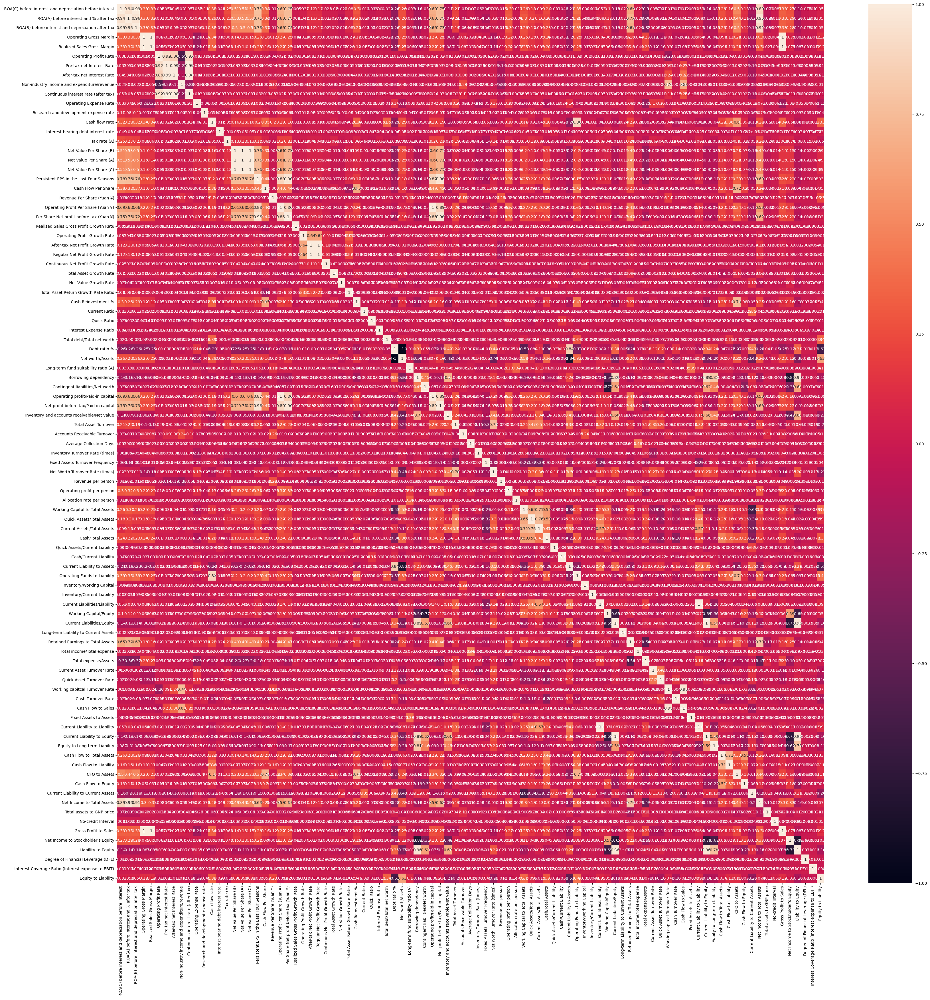

In [ ]:
float_columns_df = df.select_dtypes(include=["float"]) #we are screening only the float data type columns for correlation checking
plt.figure(figsize=(40,40))
sns.heatmap(float_columns_df.corr(),annot=True)
plt.savefig('float_corr.png')

The float columns having high positive or negative correlations are omitted from the analysis. The columns which rerpresent some pararmeter on per share basis or per share capital basis, are also kept aside. This is due to the fact that company's share capital can get increase in in case of fresh equity issue but that doesn't necessarly mean betterment of underlying business or health improvement of the company. Same with bonus share issue or share splitting or share buyback. All these will increase or decrease the number of outstanding shares but that doesn't alter the underlying business of the company.

In [ ]:
#@title selected float columns

sel_col=[
 ' ROA(C) before interest and depreciation before interest',
 #' ROA(A) before interest and % after tax',
 #' ROA(B) before interest and depreciation after tax',
 #' Operating Gross Margin',
 #' Realized Sales Gross Margin',
 ' Operating Profit Rate',
 #' Pre-tax net Interest Rate',
 #' After-tax net Interest Rate',
 ' Non-industry income and expenditure/revenue',
 #' Continuous interest rate (after tax)',
 ' Operating Expense Rate',
 ' Research and development expense rate',
 ' Cash flow rate',
 ' Interest-bearing debt interest rate',
 ' Tax rate (A)',
 #' Net Value Per Share (B)',
 #' Net Value Per Share (A)',
 #' Net Value Per Share (C)',
 #' Persistent EPS in the Last Four Seasons',
 #' Cash Flow Per Share',
 #' Revenue Per Share (Yuan ¥)',
 #' Operating Profit Per Share (Yuan ¥)',
 #' Per Share Net profit before tax (Yuan ¥)',
 ' Realized Sales Gross Profit Growth Rate',
 ' Operating Profit Growth Rate',
 #' After-tax Net Profit Growth Rate',
 ' Regular Net Profit Growth Rate',
 ' Continuous Net Profit Growth Rate',
 ' Total Asset Growth Rate',
 ' Net Value Growth Rate',
 ' Total Asset Return Growth Rate Ratio',
 ' Cash Reinvestment %',
 ' Current Ratio',
 ' Quick Ratio',
 ' Interest Expense Ratio',
 ' Total debt/Total net worth',
 #' Debt ratio %',
 #' Net worth/Assets',
 ' Long-term fund suitability ratio (A)',
 #' Borrowing dependency',
 ' Contingent liabilities/Net worth',
 #' Operating profit/Paid-in capital',
 #' Net profit before tax/Paid-in capital',
 ' Inventory and accounts receivable/Net value',
 ' Total Asset Turnover',
 ' Accounts Receivable Turnover',
 ' Average Collection Days',
 ' Inventory Turnover Rate (times)',
 #' Fixed Assets Turnover Frequency',
 ' Net Worth Turnover Rate (times)',
 ' Revenue per person',
 ' Operating profit per person',
 ' Allocation rate per person',
 ' Working Capital to Total Assets',
 ' Quick Assets/Total Assets',
 ' Current Assets/Total Assets',
 ' Cash/Total Assets',
 ' Quick Assets/Current Liability',
 ' Cash/Current Liability',
 #' Current Liability to Assets',
 #' Operating Funds to Liability',
 ' Inventory/Working Capital',
 ' Inventory/Current Liability',
 #' Current Liabilities/Liability',
 #' Working Capital/Equity',
 #' Current Liabilities/Equity',
 ' Long-term Liability to Current Assets',
 ' Retained Earnings to Total Assets',
 ' Total income/Total expense',
 ' Total expense/Assets',
 ' Current Asset Turnover Rate',
 ' Quick Asset Turnover Rate',
 #' Working capitcal Turnover Rate',
 ' Cash Turnover Rate',
 ' Cash Flow to Sales',
 ' Fixed Assets to Assets',
 ' Current Liability to Liability',
 #' Current Liability to Equity',
 #' Equity to Long-term Liability',
 ' Cash Flow to Total Assets',
 ' Cash Flow to Liability',
 ' CFO to Assets',
 #' Cash Flow to Equity',
 #' Current Liability to Current Assets',
 #' Net Income to Total Assets',
 ' Total assets to GNP price',
 ' No-credit Interval',
 #' Gross Profit to Sales',
 #" Net Income to Stockholder's Equity",
 #' Liability to Equity',
 ' Degree of Financial Leverage (DFL)',
 ' Interest Coverage Ratio (Interest expense to EBIT)',
 #' Equity to Liability'
 ]

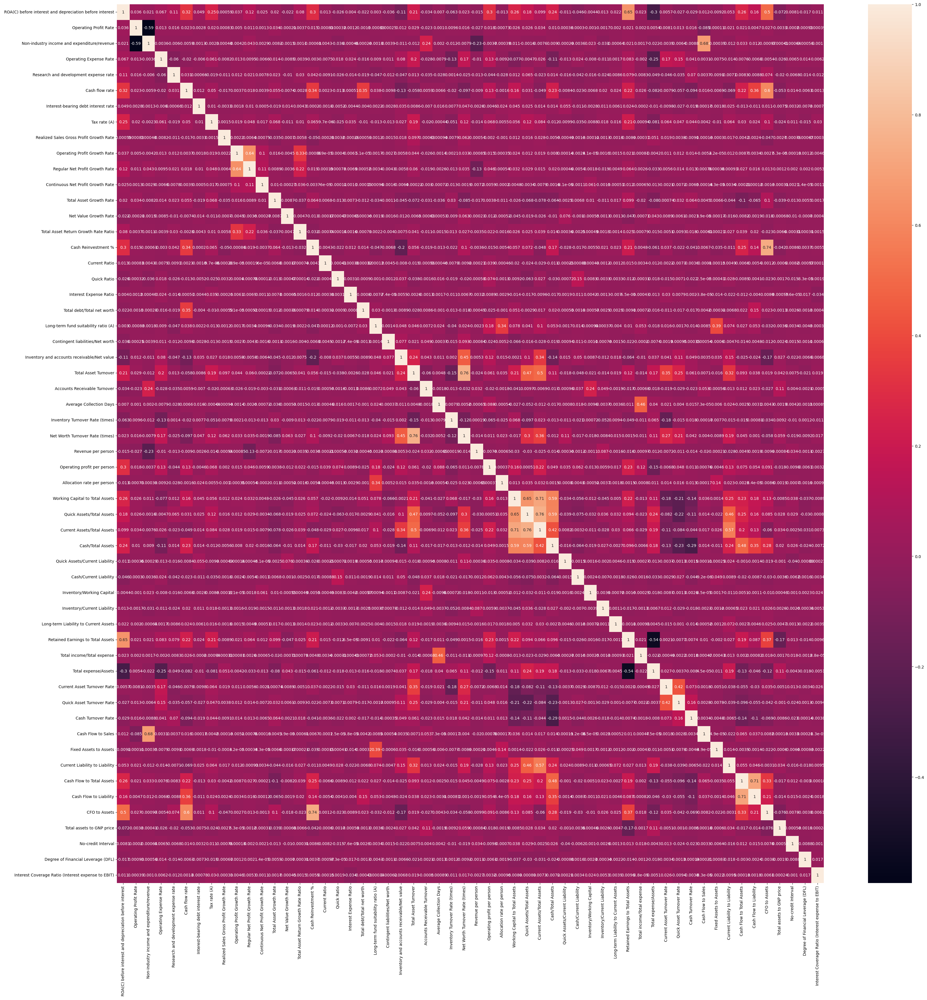

In [ ]:
plt.figure(figsize=(40,40))
sns.heatmap(float_columns_df[sel_col].corr(),annot=True)
plt.savefig('rervised_float_corr.png')

In [ ]:
## we now rervise and arrange our working dataset as follows
path= "/content/drive/MyDrive/data_science_proj/code/company_bankruptcy.csv"
df = pd.read_csv(path)
df = pd.concat([df.select_dtypes(include=["float"])[sel_col], df.select_dtypes(include=["int"])], axis = 1)
df.drop(' Net Income Flag', axis=1, inplace=True)   # all the data rows have same value
df.head()

,ROA(C) before interest and depreciation before interest,Operating Profit Rate,Non-industry income and expenditure/revenue,Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,...,Current Liability to Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Total assets to GNP price,No-credit Interval,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Bankrupt?,Liability-Assets Flag
0,0.370594,0.998969,0.302646,1.256969e-04,0.0,0.458143,0.000725,0.0,0.022102,0.848195,...,0.676269,0.637555,0.458609,0.520382,0.009219,0.622879,0.026601,0.564050,1,0
1,0.464291,0.998946,0.303556,2.897851e-04,0.0,0.461867,0.000647,0.0,0.022080,0.848088,...,0.308589,0.641100,0.459001,0.567101,0.008323,0.623652,0.264577,0.570175,1,0
2,0.426071,0.998857,0.302035,2.361297e-04,25500000.0,0.458521,0.000790,0.0,0.022760,0.848094,...,0.446027,0.642765,0.459254,0.538491,0.040003,0.623841,0.026555,0.563706,1,0
3,0.399844,0.998700,0.303350,1.078888e-04,0.0,0.465705,0.000449,0.0,0.022046,0.848005,...,0.615848,0.579039,0.448518,0.604105,0.003252,0.622929,0.026697,0.564663,1,0
4,0.465022,0.998973,0.303475,7.890000e+09,0.0,0.462746,0.000686,0.0,0.022096,0.848258,...,0.975007,0.622374,0.454411,0.578469,0.003878,0.623521,0.024752,0.575617,1,0


In [ ]:
#how many companies went bankrupt in percentage
(df['Bankrupt?'].sum()*100/df.shape[0]).round(2)

3.23

In [ ]:
df.shape

(6819, 58)

we can observe that it is a highly unbalanced data where ony 3.23 per cent companies went bankrupt.

### splitting the dataset into dependent, X and independent, y datasets.

In [ ]:
X = df.drop(['Bankrupt?'],axis=1).copy()
y = df['Bankrupt?'].copy()

We can normalize the skewed distributed data but we will lose the meaning of the original unit in which the variables were scaled. This may not be an issue for the algorithms but it can pose as a problem for finding insights and statistical analysis. The code for this case is attached below.

In [ ]:
'''
def log_trans(data):

    for col in data:
        skew = data[col].skew()
        if skew > 0.6 or skew < -0.6:
            data[col] = np.log1p(data[col])
        else:
            continue

    return data


# This mathematical function helps user to calculate natural logarithmic value of x+1 where x belongs to all the input array elements.
# log1p is reverse of exp(x) – 1.

X = log_trans(X)
X.hist(figsize = (35,30), bins = 50)
plt.show()
'''

'\ndef log_trans(data):\n\n    for col in data:\n        skew = data[col].skew()\n        if skew > 0.6 or skew < -0.6:\n            data[col] = np.log1p(data[col])\n        else:\n            continue\n\n    return data\n\n\n# This mathematical function helps user to calculate natural logarithmic value of x+1 where x belongs to all the input array elements.\n# log1p is reverse of exp(x) – 1.\n\nX = log_trans(X)\n'

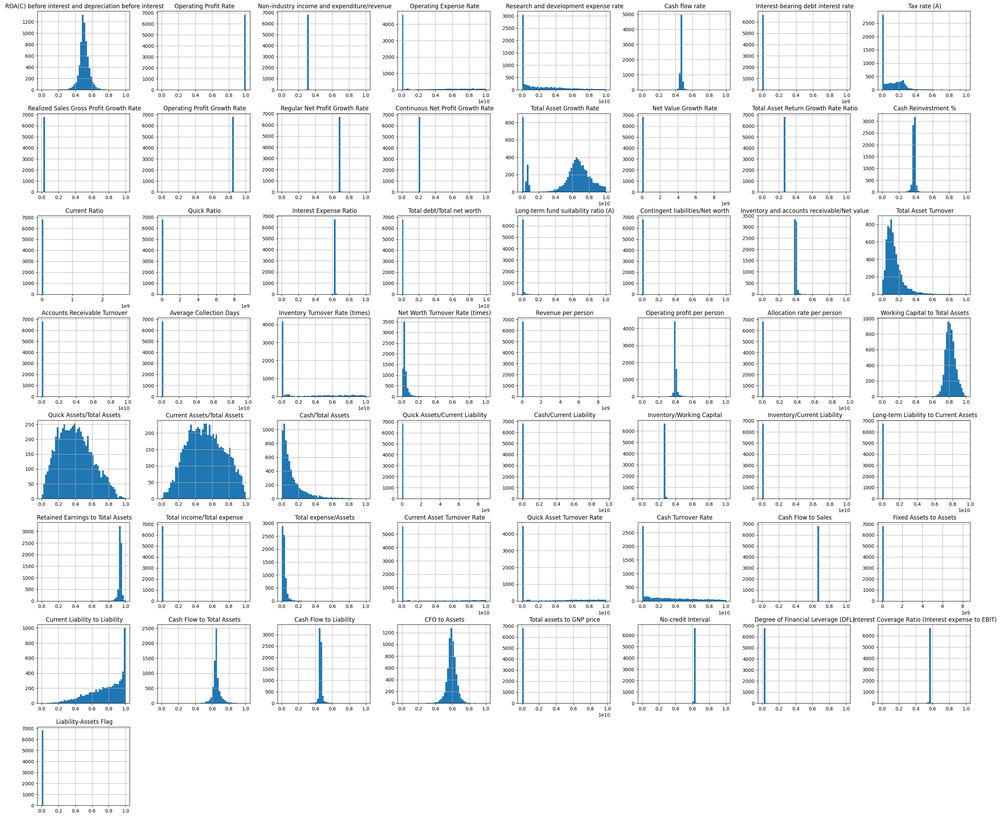

In [ ]:
X.hist(figsize = (35,30), bins = 50)
plt.show()

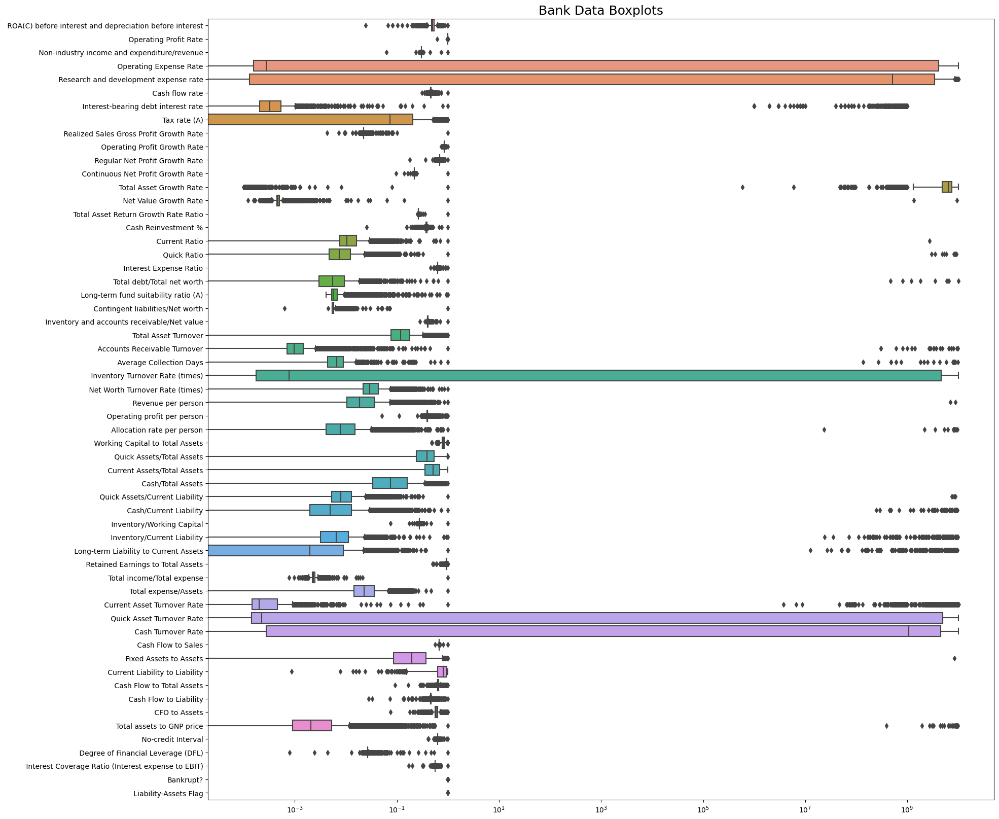

In [ ]:
plt.figure(figsize = (20,20))
ax =sns.boxplot(data = df, orient="h")
ax.set_title('Bank Data Boxplots', fontsize = 18)
ax.set(xscale="log")
plt.show()

here, we shouldn't trim off the outliers bassed on box plot (i.e. with the 99.3% data in a normally distributed graph) as we could miss out important data in this process.

In [ ]:
# splittng the datasets into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y, test_size=0.2)

# Logistic Regression

Let's try with **logistic regression** method

In [ ]:
clf = LogisticRegression()

# define grid
balance = [{0:100,1:1}, {0:10,1:1}, {0:1,1:1}, {0:1,1:10}, {0:1,1:100}]
solvers = ['sag', 'lbfgs', 'liblinear', 'newton-cholesky', 'saga']
random_state = np.random.RandomState(42)
param_grid = dict(class_weight=balance,solver=solvers,C=np.arange(0.01,1,0.01))

# define evaluation procedure
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# define grid search
random_search = RandomizedSearchCV(estimator=clf, param_distributions=param_grid, n_iter = 20, n_jobs=-1, cv=cv, scoring='accuracy',random_state=1)
# execute the grid search
random_search_result = random_search.fit(X, y)

# report the best configuration
print("Best: %f using %s" % (random_search_result.best_score_, random_search_result.best_params_))
# report all configurations
means = random_search_result.cv_results_['mean_test_score']
stds = random_search_result.cv_results_['std_test_score']
params = random_search_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.960405 using {'solver': 'liblinear', 'class_weight': {0: 1, 1: 1}, 'C': 0.23}
0.959183 (0.004698) with: {'solver': 'lbfgs', 'class_weight': {0: 1, 1: 1}, 'C': 0.43}
0.958498 (0.004400) with: {'solver': 'sag', 'class_weight': {0: 1, 1: 1}, 'C': 0.09999999999999999}
0.060273 (0.006300) with: {'solver': 'lbfgs', 'class_weight': {0: 1, 1: 100}, 'C': 0.44}
0.958987 (0.004322) with: {'solver': 'sag', 'class_weight': {0: 10, 1: 1}, 'C': 0.37}
0.958498 (0.004400) with: {'solver': 'sag', 'class_weight': {0: 1, 1: 1}, 'C': 0.39}
0.939825 (0.006967) with: {'solver': 'saga', 'class_weight': {0: 1, 1: 10}, 'C': 0.060000000000000005}
0.958939 (0.003819) with: {'solver': 'saga', 'class_weight': {0: 100, 1: 1}, 'C': 0.060000000000000005}
0.958890 (0.003772) with: {'solver': 'liblinear', 'class_weight': {0: 100, 1: 1}, 'C': 0.49}
0.959476 (0.003349) with: {'solver': 'sag', 'class_weight': {0: 100, 1: 1}, 'C': 0.53}
0.958401 (0.004221) with: {'solver': 'newton-cholesky', 'class_weight': {0: 100,

Accuracy score

Best: 0.960405 using {'solver': 'liblinear', 'class_weight': {0: 1, 1: 1}, 'C': 0.23}

### let's try with the best accuracy parameters  

In [ ]:
clf = LogisticRegression(solver='liblinear', class_weight={0:1, 1:1}, C = 0.23)

clf.fit(X_train, y_train)
predictions = clf.predict(X_test)

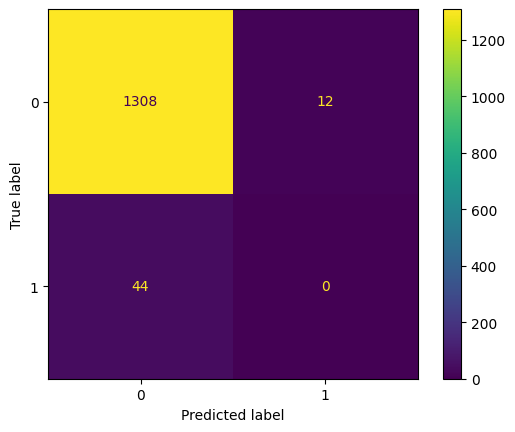

In [ ]:
cm = confusion_matrix(y_test, predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

We found that though the accuracy is high, the model fails to capture the positives. So it is of no use !

In [ ]:
clf.fit(X_train, y_train)

# Predict class labels on training data
pred_labels_tr = clf.predict(X_train)
# Predict class labels on a test data
pred_labels_te = clf.predict(X_test)

# Basic info about the model
print('*************** Logistic Regression Summary ***************')
#print('No. of classes: ', clf.n_classes_)
print('Classes: ', clf.classes_)
print('No. of features: ', clf.n_features_in_)
#print('No. of Estimators: ', clf.n_estimators)
print('--------------------------------------------------------')
print("")

print('*************** Evaluation on Test Data ***************')
score_te = clf.score(X_test, y_test)
print('Accuracy Score: ', score_te)
# Look at classification report to evaluate the model
print(classification_report(y_test, pred_labels_te))
print('--------------------------------------------------------')
print("")

print('*************** Evaluation on Training Data ***************')
score_tr = clf.score(X_train, y_train)
print('Accuracy Score: ', score_tr)
# Look at classification report to evaluate the model
print(classification_report(y_train, pred_labels_tr))
print('--------------------------------------------------------')

*************** Logistic Regression Summary ***************
Classes:  [0 1]
No. of features:  57
--------------------------------------------------------

*************** Evaluation on Test Data ***************
Accuracy Score:  0.9589442815249267
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1320
           1       0.00      0.00      0.00        44

    accuracy                           0.96      1364
   macro avg       0.48      0.50      0.49      1364
weighted avg       0.94      0.96      0.95      1364

--------------------------------------------------------

*************** Evaluation on Training Data ***************
Accuracy Score:  0.9609532538955087
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      5279
           1       0.09      0.02      0.04       176

    accuracy                           0.96      5455
   macro avg       0.53      0.51      0.51      5455


let's study the tp, fn and fp with varying the thresholds.

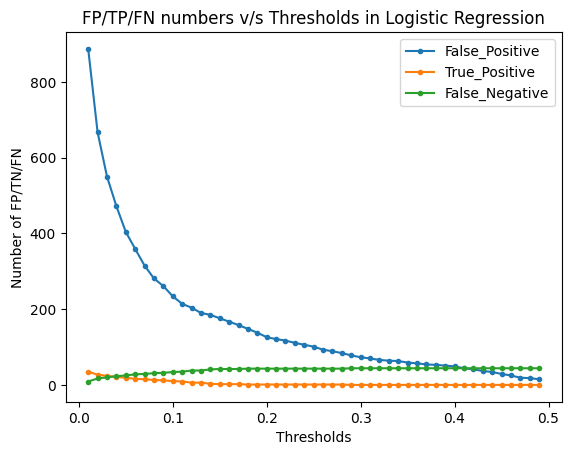

In [ ]:
threshold = [i for i in np.arange(0.01, 0.5, 0.01)]
fp=[]
tp=[]
fn=[]
for thr in threshold:
    y_pred = (clf.predict_proba(X_test)[:, 1] >= thr).astype('float')
    fp.append(confusion_matrix(y_test, y_pred)[0,1])
    tp.append(confusion_matrix(y_test, y_pred)[1,1])
    fn.append(confusion_matrix(y_test, y_pred)[1,0])

plt.plot(threshold, fp, marker='.', label='False_Positive')
plt.plot(threshold, tp, marker='.', label='True_Positive')
plt.plot(threshold, fn, marker='.', label='False_Negative')
plt.xlabel('Thresholds')
plt.ylabel('Number of FP/TN/FN')
plt.title('FP/TP/FN numbers v/s Thresholds in Logistic Regression')
plt.legend()
plt.show()

This clearly indicates logistic regression model fails to significantly capture bankruptcy at any threshold value

Let's try with 0.1 as threshold so as to capture the positives.

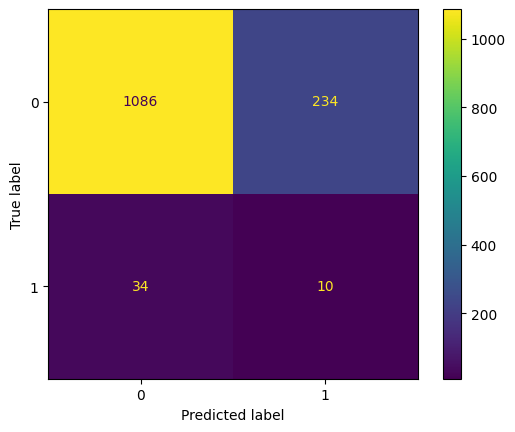

In [ ]:
threshold = 0.1
y_pred = (clf.predict_proba(X_test)[:, 1] >= threshold).astype('float')
confusion_matrix(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()
plt.show()

We can observe that even changing the threshold probabilty to 0.1 we are not able to outpace the false negatives. It is also to be noted that the the number of false positive is so high which will incurr so much cost during financial investigation, defeating the purpose of using ML to predict bankruptcy.

# Random Forest Classification

Now, let's try with Random Forest Classifier.

In [ ]:
clf = RandomForestClassifier()

params = {'max_features' : ['sqrt', 'log2'],
              'class_weight' : ['balanced','balanced_subsample'],
              'criterion' : ['gini', 'entropy', 'log_loss'],
              'bootstrap' : [True,False]}

random_search = RandomizedSearchCV(clf,param_distributions=params,n_iter=5,
                                   random_state = 1,
                                 n_jobs=-1,cv=5,verbose=3,
                                 return_train_score=True,
                                 error_score='raise')

#fitting random_search to the traning set
random_search.fit(X, y)

random_search.best_params_

Fitting 5 folds for each of 5 candidates, totalling 25 fits


{'max_features': 'sqrt',
 'criterion': 'entropy',
 'class_weight': 'balanced',
 'bootstrap': False}

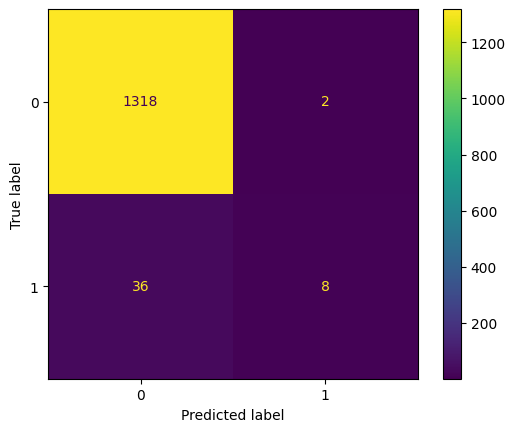

In [ ]:
clf = RandomForestClassifier(max_features= 'log2',
                            criterion= 'entropy',
                            class_weight= 'balanced_subsample',
                            bootstrap= False)
clf.fit(X_train, y_train)
predictions = clf.predict(X_test)
cm = confusion_matrix(y_test, predictions, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=clf.classes_)
disp.plot()
plt.show()

Random Forest does a decent job in classifying bankrupt companies at 0.5 probability threshold value.

In [ ]:
# Predict class labels on training data
pred_labels_tr = clf.predict(X_train)
# Predict class labels on a test data
pred_labels_te = clf.predict(X_test)

# Basic info about the model
print('*************** Random Forest Summary ***************')
print('No. of classes: ', clf.n_classes_)
print('Classes: ', clf.classes_)
print('No. of features: ', clf.n_features_in_)
print('No. of Estimators: ', clf.n_estimators)
print('--------------------------------------------------------')
print("")

print('*************** Evaluation on Test Data ***************')
score_te = clf.score(X_test, y_test)
print('Accuracy Score: ', score_te)
# Look at classification report to evaluate the model
print(classification_report(y_test, pred_labels_te))
print('--------------------------------------------------------')
print("")

print('*************** Evaluation on Training Data ***************')
score_tr = clf.score(X_train, y_train)
print('Accuracy Score: ', score_tr)
# Look at classification report to evaluate the model
print(classification_report(y_train, pred_labels_tr))
print('--------------------------------------------------------')

*************** Random Forest Summary ***************
No. of classes:  2
Classes:  [0 1]
No. of features:  57
No. of Estimators:  100
--------------------------------------------------------

*************** Evaluation on Test Data ***************
Accuracy Score:  0.9721407624633431
              precision    recall  f1-score   support

           0       0.97      1.00      0.99      1320
           1       0.80      0.18      0.30        44

    accuracy                           0.97      1364
   macro avg       0.89      0.59      0.64      1364
weighted avg       0.97      0.97      0.96      1364

--------------------------------------------------------

*************** Evaluation on Training Data ***************
Accuracy Score:  1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5279
           1       1.00      1.00      1.00       176

    accuracy                           1.00      5455
   macro avg       1.00      1.0

Let's examine with different threshold values upon which we will determine how many true positives, false negatives and false positives we are getting.

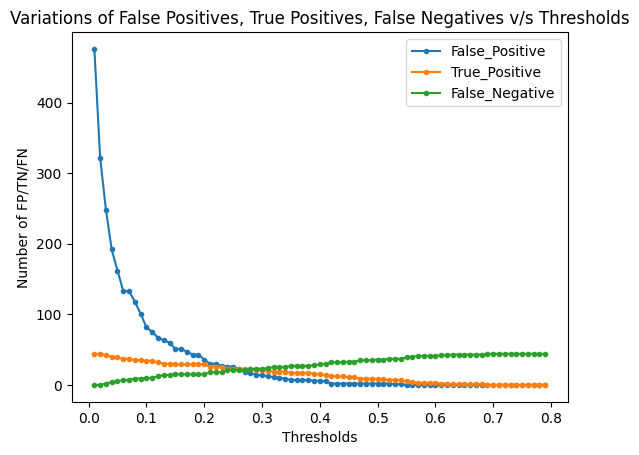

In [ ]:
threshold = [i for i in np.arange(0.01, 0.8, 0.01)]
fp=[]
tp=[]
fn=[]
for thr in threshold:
    y_pred = (clf.predict_proba(X_test)[:, 1] >= thr).astype('float')
    fp.append(confusion_matrix(y_test, y_pred)[0,1])
    tp.append(confusion_matrix(y_test, y_pred)[1,1])
    fn.append(confusion_matrix(y_test, y_pred)[1,0])

plt.plot(threshold, fp, marker='.', label='False_Positive')
plt.plot(threshold, tp, marker='.', label='True_Positive')
plt.plot(threshold, fn, marker='.', label='False_Negative')
plt.xlabel('Thresholds')
plt.ylabel('Number of FP/TN/FN')
plt.title('Variations of False Positives, True Positives, False Negatives v/s Thresholds')
plt.legend()
plt.show()

here we are setting 0.25 as threshold to see how the model could pick the positives.

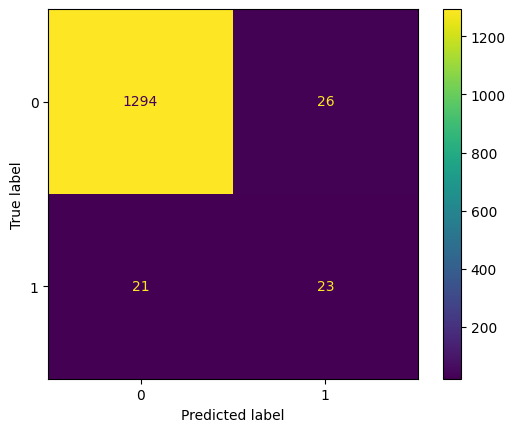

In [ ]:
threshold = 0.25
y_pred = (clf.predict_proba(X_test)[:, 1] >= threshold).astype('float')
confusion_matrix(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()
plt.show()

Here, we can pick 23 True Positives, previously it was 8 only. There are now 21 False Negatives which is better than the previous model where these value was 36. But, False Positives went to 26, increased from 2 which we can consider to study further.

# XGBoost Classification

Now we will use XGBoost Classification model. Becasue it is an ensemble learning model, the accuracy will be better and by tuning differernt hyper -pararmeters. Thus, we can catch those positive target values.

In [ ]:
clf = xgboost.XGBClassifier()

# testing a set of pararmeters
params={
    "objective"     : ['binary:hinge','binary:logistic'],
 "learning_rate"    : [0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.4, 0.45, 0.5] ,
 "max_depth"        : [ 3, 4, 5, 6,7, 8,9, 10],
 "min_child_weight" : [ 1, 3, 5, 7 ],
 "gamma"            : [ 0.0, 0.1, 0.2 , 0.3, 0.4 ],
 "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ],
 "booster"          : ['gbtree', 'dart'],
 "eval_metric"      : ['rmse', 'rmsle', 'logloss', 'auc', 'aucpr']
}

#random_search object
random_search = RandomizedSearchCV(clf,param_distributions=params,n_iter=5,
                                   random_state=1,
                                 n_jobs=-1,cv=5,verbose=3,
                                 return_train_score=True,
                                 error_score='raise')

random_search_result = random_search.fit(X, y)

# report the best configuration
print("Best: %f using %s" % (random_search_result.best_score_, random_search_result.best_params_))
# report all configurations
means = random_search_result.cv_results_['mean_test_score']
stds = random_search_result.cv_results_['std_test_score']
params = random_search_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best: 0.960699 using {'objective': 'binary:logistic', 'min_child_weight': 1, 'max_depth': 4, 'learning_rate': 0.15, 'gamma': 0.3, 'eval_metric': 'rmse', 'colsample_bytree': 0.7, 'booster': 'gbtree'}
0.957473 (0.015417) with: {'objective': 'binary:logistic', 'min_child_weight': 3, 'max_depth': 8, 'learning_rate': 0.5, 'gamma': 0.3, 'eval_metric': 'rmse', 'colsample_bytree': 0.5, 'booster': 'dart'}
0.952488 (0.020885) with: {'objective': 'binary:hinge', 'min_child_weight': 5, 'max_depth': 4, 'learning_rate': 0.25, 'gamma': 0.1, 'eval_metric': 'aucpr', 'colsample_bytree': 0.3, 'booster': 'dart'}
0.953661 (0.026956) with: {'objective': 'binary:hinge', 'min_child_weight': 1, 'max_depth': 4, 'learning_rate': 0.1, 'gamma': 0.3, 'eval_metric': 'rmsle', 'colsample_bytree': 0.3, 'booster': 'gbtree'}
0.960553 (0.011100) with: {'objective': 'binary:logistic', 'min_child_weight': 7, 'max_depth': 10, 'learning_rate': 0.1, 'gamma': 0.3, 'eva

In [ ]:
#defining the model best hyper parameters in the random
clf = xgboost.XGBClassifier(objective= 'binary:logistic',
                                 missing = np.nan,
                                 n_estimators=100,
                                 min_child_weight=1,
                                 max_depth= 4,
                                 learning_rate= 0.15,
                                 gamma= 0.3,
                                 eval_metric= 'rmse',
                                 colsample_bytree= 0.7,
                                 booster='gbtree')

In [ ]:
# cross validation on the training data set
score = cross_val_score(clf , X, y, cv=5, error_score='raise')
score.mean()*100 , score.std()*100

(96.0699401656257, 1.458352010718243)

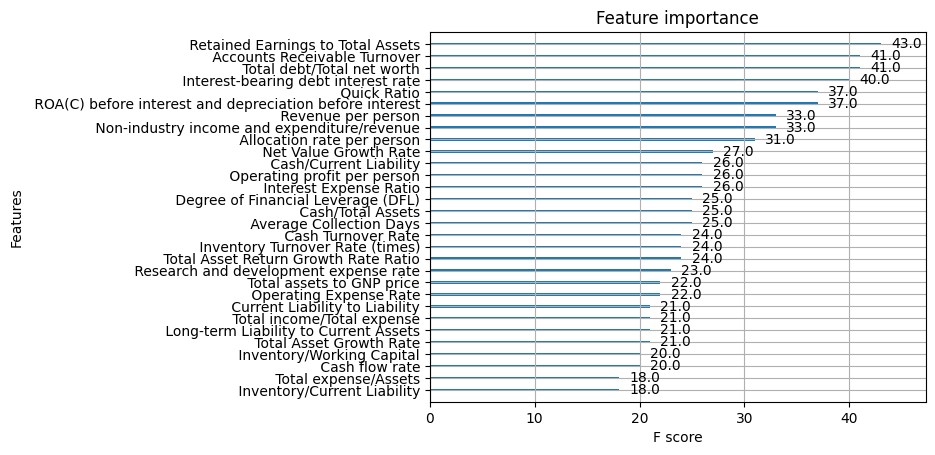

In [ ]:
%matplotlib inline
from xgboost import XGBClassifier, plot_importance
fit = XGBClassifier(objective= 'binary:logistic',
                                 missing = np.nan,
                                 n_estimators=100,
                                 min_child_weight=1,
                                 max_depth= 4,
                                 learning_rate= 0.15,
                                 gamma= 0.3,
                                 eval_metric= 'rmse',
                                 colsample_bytree= 0.7,
                                 booster='gbtree').fit(X, y)
plot_importance(fit, max_num_features=30)
plt.show()

The feature importance while prerdicting a observatiion is averaged in terms of f-score. The Retained Earnings to total asset is a key feature. It actually signifies how a companyy can proficiently churn profits.

In [ ]:
!pip install shap
import shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 33.7 MB/s eta 0:00:00


In [ ]:
model=XGBClassifier(objective= 'binary:logistic',
                                 missing = np.nan,
                                 n_estimators=100,
                                 min_child_weight=1,
                                 max_depth= 4,
                                 learning_rate= 0.15,
                                 gamma= 0.3,
                                 eval_metric= 'rmse',
                                 colsample_bytree= 0.7,
                                 booster='gbtree')

model.fit(X_train, y_train)

# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)
# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)

Permutation explainer: 1365it [03:38,  6.17it/s]


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


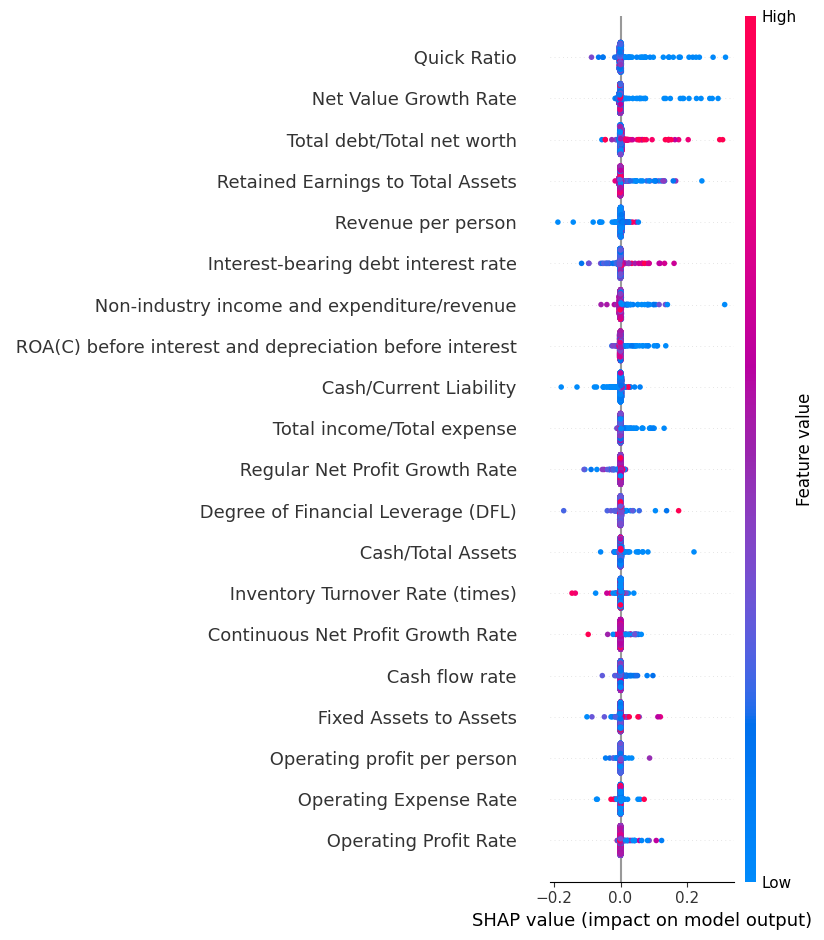

In [ ]:
shap.summary_plot(shap_values)

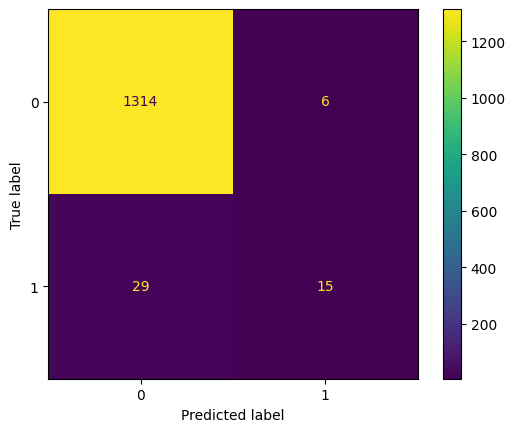

In [ ]:
clf = xgboost.XGBClassifier(objective= 'binary:logistic',
                                 missing = np.nan,
                                 n_estimators=100,
                                 min_child_weight=1,
                                 max_depth= 4,
                                 learning_rate= 0.15,
                                 gamma= 0.3,
                                 eval_metric= 'rmse',
                                 colsample_bytree= 0.7,
                                 booster='gbtree')
clf.fit(X_train, y_train)
predictions = clf.predict(X_test)
cm = confusion_matrix(y_test, predictions, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=clf.classes_)
disp.plot()
plt.show()

let's try with different threshold values to observe how this model behaves in predicting positives.

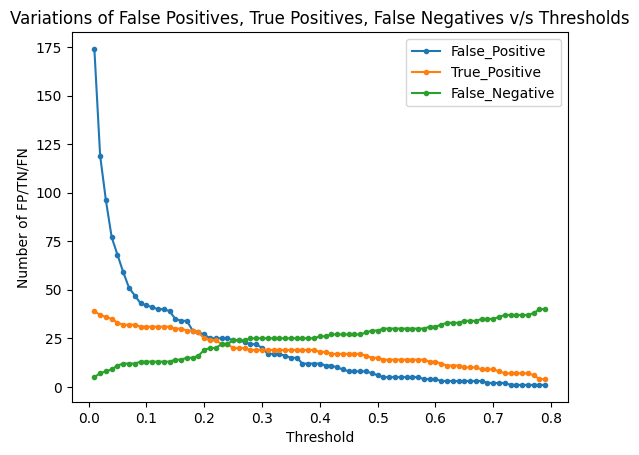

In [ ]:
threshold = [i for i in np.arange(0.01, 0.8, 0.01)]
fp=[]
tp=[]
fn=[]
for thr in threshold:
    y_pred = (clf.predict_proba(X_test)[:, 1] >= thr).astype('float')
    fp.append(confusion_matrix(y_test, y_pred)[0,1])
    tp.append(confusion_matrix(y_test, y_pred)[1,1])
    fn.append(confusion_matrix(y_test, y_pred)[1,0])

plt.plot(threshold, fp, marker='.', label='False_Positive')
plt.plot(threshold, tp, marker='.', label='True_Positive')
plt.plot(threshold, fn, marker='.', label='False_Negative')
plt.xlabel('Threshold')
plt.ylabel('Number of FP/TN/FN')
plt.title('Variations of False Positives, True Positives, False Negatives v/s Thresholds')
plt.legend()
plt.show()

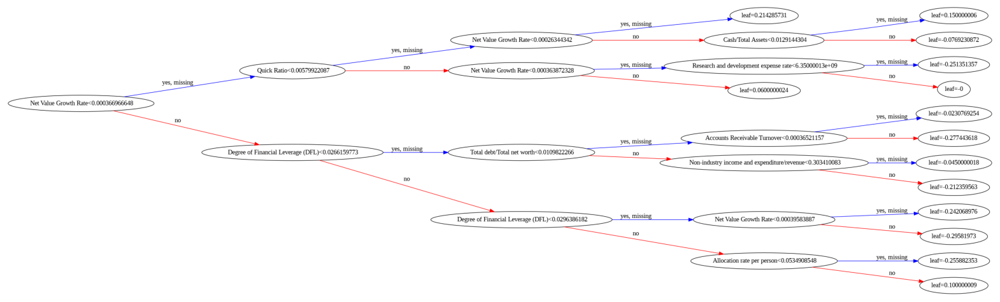

In [ ]:
from xgboost import plot_tree
plot_tree(clf, rankdir='LR')
#plt.rcParams['figure.figsize']=[50, 30]
plt.gcf().set_size_inches(20, 10)
plt.savefig("Bankruptcy_xgb.png")

In [ ]:
# Predict class labels on training data
pred_labels_tr = clf.predict(X_train)
# Predict class labels on a test data
pred_labels_te = clf.predict(X_test)

# Basic info about the model
print('*************** Tree Summary ***************')
print('No. of classes: ', clf.n_classes_)
print('Classes: ', clf.classes_)
print('No. of features: ', clf.n_features_in_)
print('No. of Estimators: ', clf.n_estimators)
print('--------------------------------------------------------')
print("")

print('*************** Evaluation on Test Data ***************')
score_te = clf.score(X_test, y_test)
print('Accuracy Score: ', score_te)
# Look at classification report to evaluate the model
print(classification_report(y_test, pred_labels_te))
print('--------------------------------------------------------')
print("")

print('*************** Evaluation on Training Data ***************')
score_tr = clf.score(X_train, y_train)
print('Accuracy Score: ', score_tr)
# Look at classification report to evaluate the model
print(classification_report(y_train, pred_labels_tr))
print('--------------------------------------------------------')

*************** Tree Summary ***************
No. of classes:  2
Classes:  [0 1]
No. of features:  57
No. of Estimators:  100
--------------------------------------------------------

*************** Evaluation on Test Data ***************
Accuracy Score:  0.9743401759530792
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1320
           1       0.71      0.34      0.46        44

    accuracy                           0.97      1364
   macro avg       0.85      0.67      0.72      1364
weighted avg       0.97      0.97      0.97      1364

--------------------------------------------------------

*************** Evaluation on Training Data ***************
Accuracy Score:  0.9994500458295142
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5279
           1       1.00      0.98      0.99       176

    accuracy                           1.00      5455
   macro avg       1.00   

No Skill: ROC AUC=0.500
XGB: ROC AUC=0.957
Best Threshold=0.007227, G-Mean=0.886


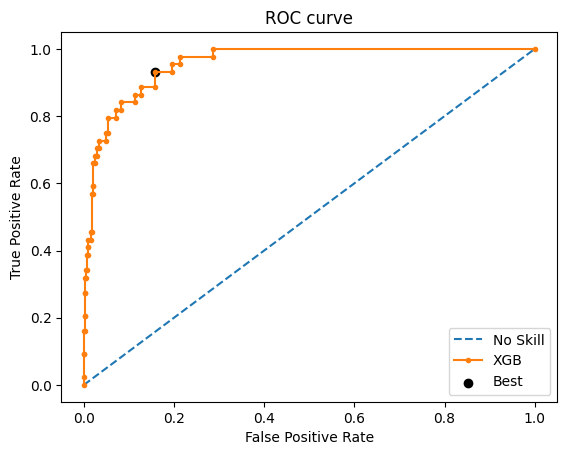

In [ ]:
# predict probabilities
clf_probs = clf.predict_proba(X_test)
# keep probabilities for the positive outcome only
clf_probs = clf_probs[:, 1]

# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(y_test))]

# calculate scores
clf_auc = roc_auc_score(y_test, clf_probs)
ns_auc = roc_auc_score(y_test, ns_probs)

# predict probabilities
yhat = clf.predict_proba(X_test)
# keep probabilities for the positive outcome only
yhat = yhat[:, 1]
# calculate roc curves
fpr, tpr, thresholds = roc_curve(y_test, yhat)
fnr = 1- tpr

gmeans = np.sqrt(tpr * (1-fpr))

# locate the index of the largest g-mean
ix = np.argmax(gmeans)

print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('XGB: ROC AUC=%.3f' % (clf_auc))
print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
plt.plot(fpr, tpr, marker='.', label='XGB')
plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curve')
plt.legend()
# show the plot
plt.show()

XGB: f1=0.462 auc=0.545
Best Threshold=0.185715, F-Score=0.574


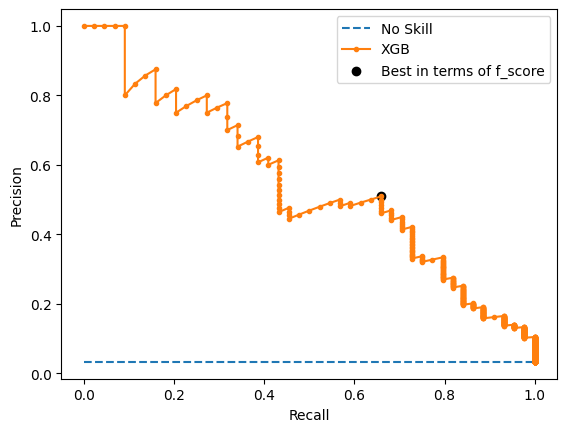

In [ ]:
# predict probabilities
clf_probs = clf.predict_proba(X_test)
# keep probabilities for the positive outcome only
clf_probs = clf_probs[:, 1]
# predict class values
yhat = clf.predict(X_test)


clf_precision, clf_recall, thresholds = precision_recall_curve(y_test, clf_probs) # thrershold change
clf_f1, clf_auc = f1_score(y_test, yhat), auc(clf_recall, clf_precision)

# calculate roc curves
precision, recall, thresholds = precision_recall_curve(y_test, clf_probs)
# convert to f score
fscore = (2 * precision * recall) / (precision + recall)
# locate the index of the largest f score
ix = np.argmax(fscore)

# summarize scores
print('XGB: f1=%.3f auc=%.3f' % (clf_f1, clf_auc))
print('Best Threshold=%f, F-Score=%.3f' % (thresholds[ix], fscore[ix]))

# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
plt.plot(clf_recall, clf_precision, marker='.', label='XGB')
plt.scatter(recall[ix], precision[ix], marker='o', color='black', label='Best in terms of f_score')

# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show()

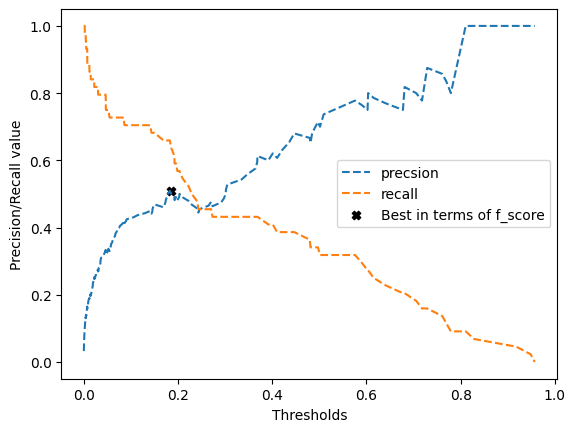

In [ ]:
plt.plot(thresholds, precision[1:,], linestyle='--',label='precsion')
plt.plot(thresholds, recall[1:,], linestyle='--',label='recall')
plt.scatter(thresholds[ix], precision[ix], marker='X', color='black', label='Best in terms of f_score')
plt.xlabel('Thresholds')
plt.ylabel('Precision/Recall value')
plt.legend()
plt.show()

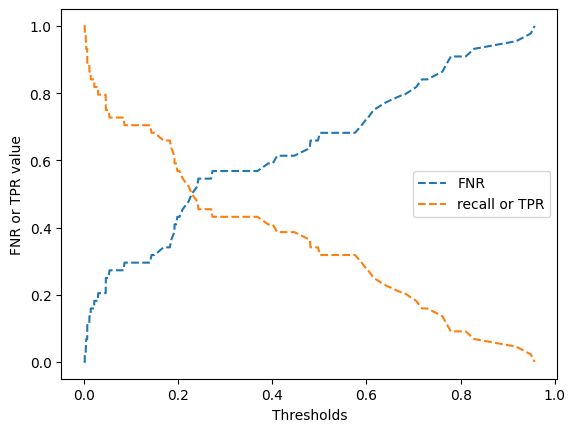

In [ ]:
fnr = 1 - recall
plt.plot(thresholds, fnr[1:,], linestyle='--',label='FNR')
plt.plot(thresholds, recall[1:,], linestyle='--',label='recall or TPR')
#pyplot.scatter(thresholds[ix], precision[ix], marker='X', color='black', label='Best')
plt.xlabel('Thresholds')
plt.ylabel('FNR or TPR value')
plt.legend()
plt.show()

Here, we can try with changing the threshold probability value to 0.2 instead of default 0.5 to determine whether the target value will be 0 or 1. We are reducing the threshold so as to decrease the **false negative** as the cost of false negative is really high. The investment if done into a company which can potentially go bankrupt will draw the asset quality downwards!

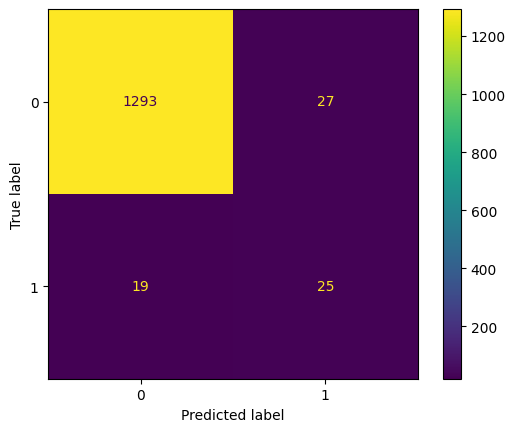

In [ ]:
threshold = 0.2
y_pred = (clf.predict_proba(X_test)[:, 1] >= threshold).astype('float')
confusion_matrix(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=clf.classes_)
disp.plot()
plt.show()

The **false negatives** went down to 19 instead of 29 as it was before. The **true positive** went up to 25 in compared to 15 before. But **false positive** went up to 27 as it was 6 before, which is comparatively okay as we can introspect into their financials further.